In [6]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt

In [7]:
img=cv2.imread("/content/IMG-20240206-WA0035 (1).jpg")
img


array([[[ 30,  39,  83],
        [ 44,  55,  99],
        [ 59,  70, 114],
        ...,
        [133, 136, 134],
        [146, 149, 147],
        [152, 155, 153]],

       [[ 30,  39,  83],
        [ 46,  55,  99],
        [ 59,  70, 114],
        ...,
        [138, 141, 139],
        [147, 150, 148],
        [153, 156, 154]],

       [[ 33,  39,  84],
        [ 45,  54,  98],
        [ 58,  69, 113],
        ...,
        [141, 144, 142],
        [146, 149, 147],
        [153, 156, 154]],

       ...,

       [[ 56,  48, 125],
        [ 54,  46, 123],
        [ 50,  42, 119],
        ...,
        [ 52,  56,  61],
        [ 38,  43,  46],
        [ 37,  40,  44]],

       [[ 55,  47, 124],
        [ 53,  45, 122],
        [ 50,  42, 119],
        ...,
        [ 56,  61,  64],
        [ 42,  47,  50],
        [ 32,  35,  39]],

       [[ 54,  46, 123],
        [ 53,  45, 122],
        [ 50,  42, 119],
        ...,
        [ 59,  64,  67],
        [ 45,  50,  53],
        [ 31,  35,  36]]

In [8]:
img =cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
rows, cols, ch=img.shape

#triangular vertices in the source image

In [9]:
pt1=np.float32([[10,100],
 [200,50],
  [50,250]])

In [10]:
pt2 = np.float32([[10, 100],
                   [200, 50],
                   [100, 250]])

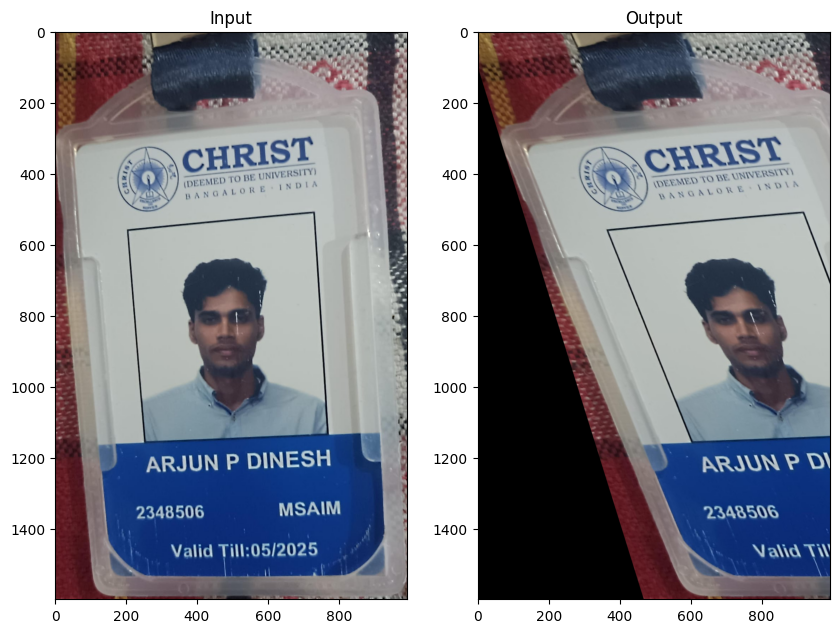

In [11]:
Mat = cv2.getAffineTransform(pt1, pt2)
dst = cv2.warpAffine(img, Mat, (cols, rows))
plt.figure(figsize=(10,10))
# Plotting the input image
plt.subplot(121)
plt.imshow(img)
plt.title('Input')
# Plotting the output image
plt.subplot(122)
plt.imshow(dst)
plt.title('Output')

plt.show()

Rotation in image

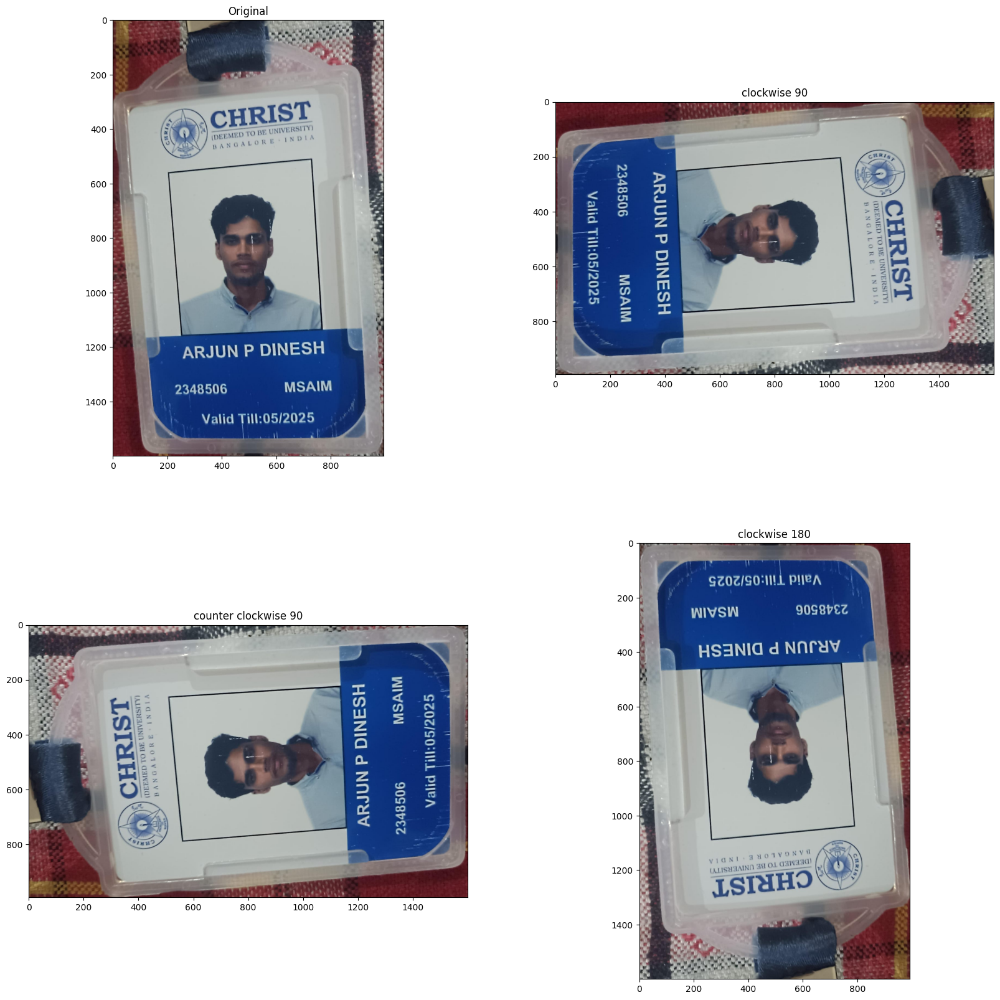

In [12]:
plt.figure(figsize=(20,20))
# Displaying the original image
plt.subplot(221)
plt.title('Original')
plt.imshow(img)
# Rotating the image in clockwise direction by 90 degrees
rotated_image = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
# Displaying the rotated image
plt.subplot(222)
plt.title('clockwise 90')
plt.imshow(rotated_image)
# Rotating the image in counter clockwise direction by 90 degrees
rotated_image = cv2.rotate(img, cv2.ROTATE_90_COUNTERCLOCKWISE)
# Displaying the rotated image
plt.subplot(223)
plt.title('counter clockwise 90')
plt.imshow(rotated_image)
# Rotating the image by 180 degrees
rotated_image = cv2.rotate(img, cv2.ROTATE_180)
# Displaying the rotated image
plt.subplot(224)
plt.title('clockwise 180')
plt.imshow(rotated_image)
plt.show()

Scaling:
zooming in or out

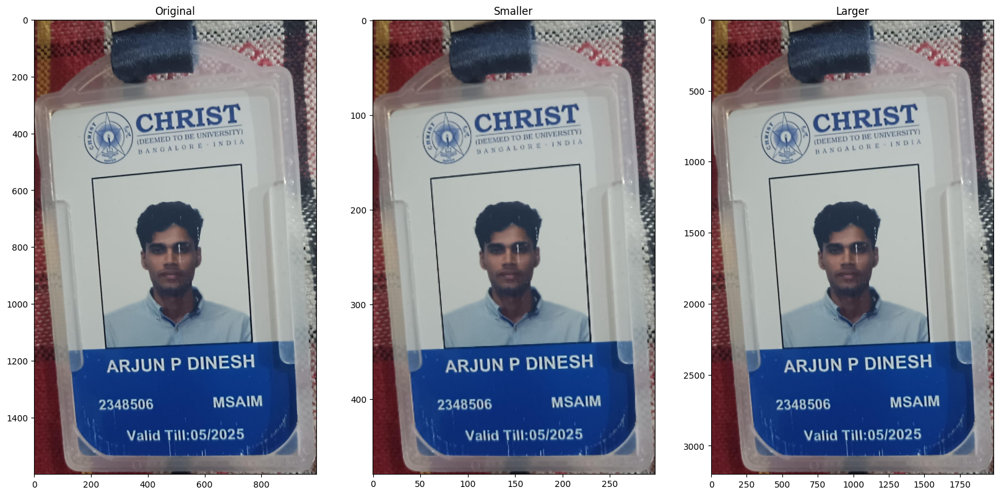

In [13]:
plt.figure(figsize=(20,20))
# Displaying the original image
plt.subplot(131)
plt.title('Original')
plt.imshow(img)

# The image is scaled to a smaller size of the original image
resized_image = cv2.resize(img, dsize=(0,0), fx=0.3, fy=0.3)
plt.subplot(132)
plt.title('Smaller')
plt.imshow(resized_image)

# The image is scaled to a larger size of the original image
resized_image = cv2.resize(img, dsize=(0,0), fx=2.0, fy=2.0)
plt.subplot(133)
plt.title('Larger')
plt.imshow(resized_image)
plt.show()

Translation:
Translation operation in image processing refers to the rectilinear shift in the positioning of an image i.e. shifting the image from one position to another.
If the amount of horizontal shift and the vertical direction is known, then a transformation matrix can be comput

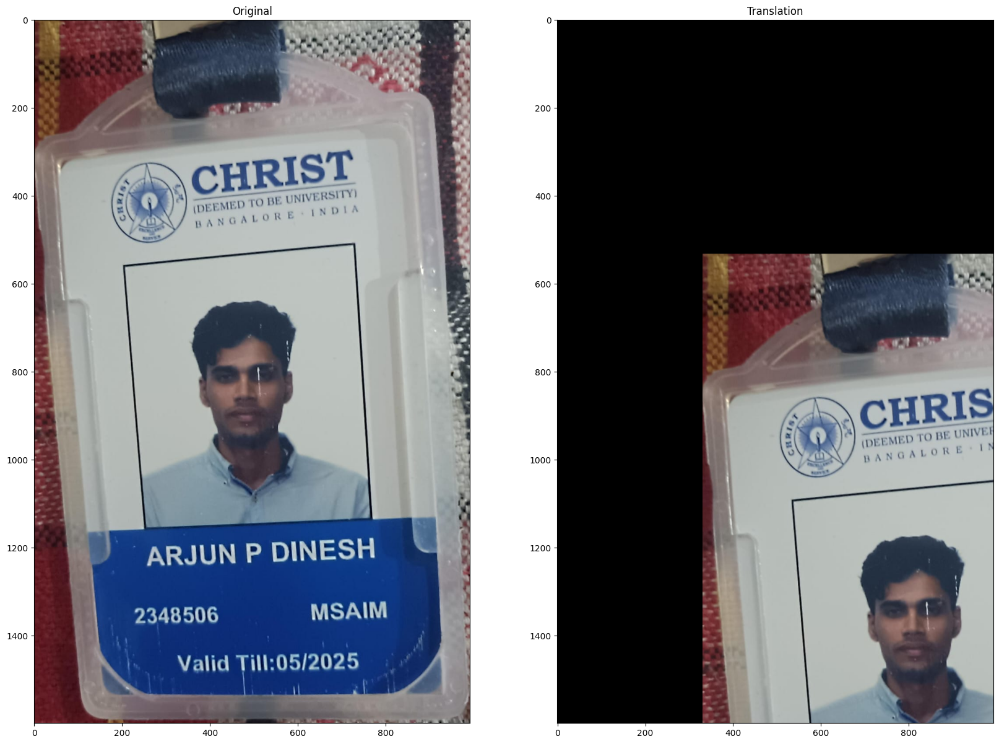

In [14]:
height, width = img.shape[:2]

# Defining the shifting coordinates
quarter_height, quarter_width = height/3, width/3
Coordinates = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])

# Creating the transformation matrix
img_translation = cv2.warpAffine(img, Coordinates, (width, height))
# Setting the grid size
plt.figure(figsize=(20,20))
# Plotting the original image
plt.subplot(121)
plt.title('Original')
plt.imshow(img)
# Plotting the translation image
plt.subplot(122)
plt.title('Translation')
plt.imshow(img_translation)
plt.show()

Shearing:
Shearing deals with changing the shape and size of the 2D object along x-axis and y-axis. It is similar to sliding the layers in one direction to change the shape of the 2D object.It is an ideal technique to change the shape of an existing object in a two dimensional plane.

shearing in x axis

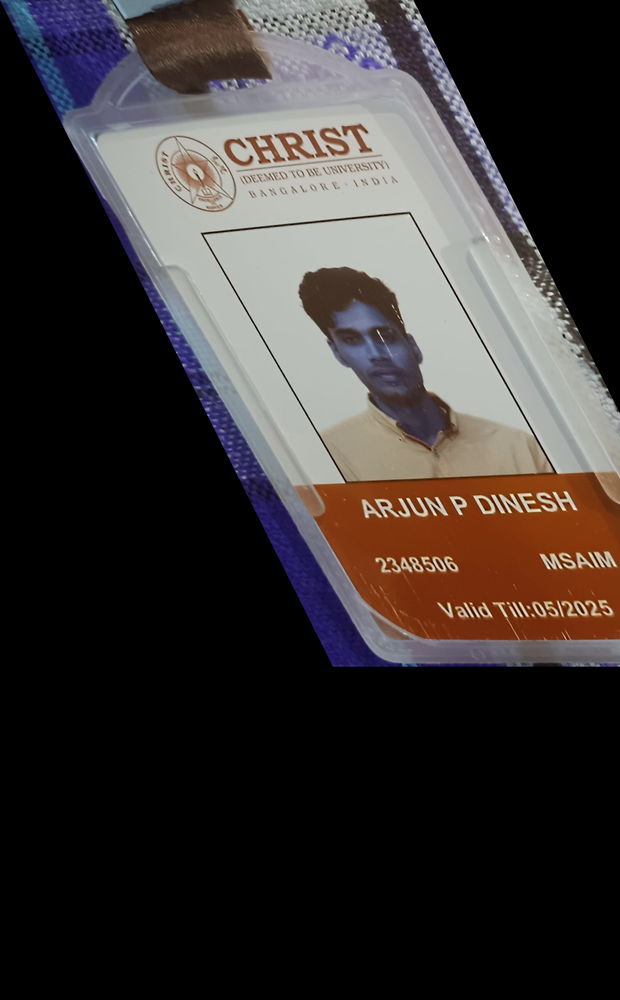

In [15]:
M = np.float32([[1, 0.5, 0], [0, 1, 0], [0, 0, 1]])
sheared_img = cv2.warpPerspective(img, M, (int(cols*1.5), int(rows*1.5)))
cv2_imshow(sheared_img)


shearing in y axis

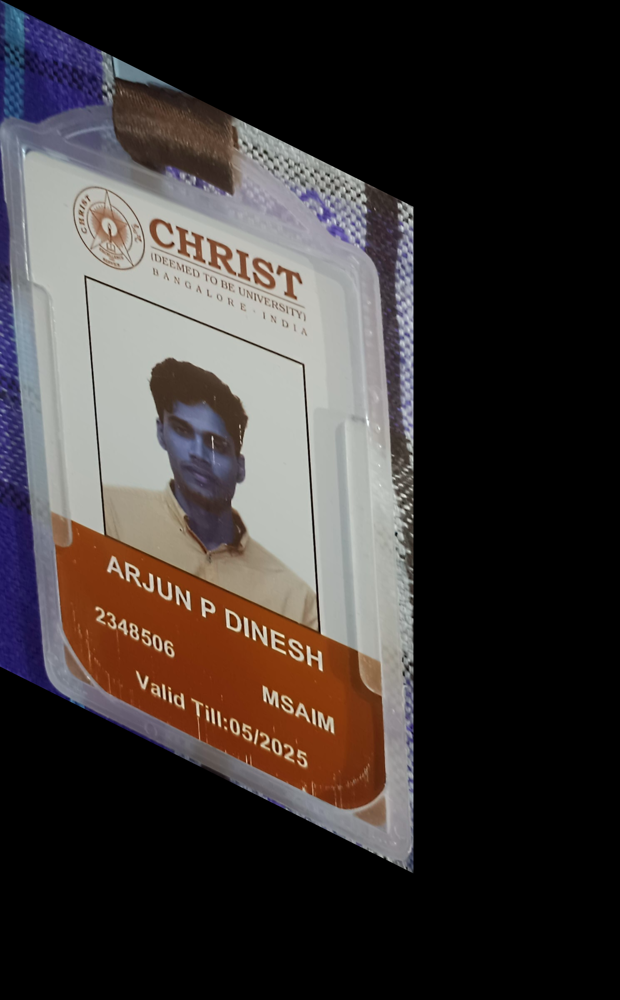

In [16]:
M = np.float32([[1,   0, 0], [0.5, 1, 0], [0,   0, 1]])
sheared_img = cv2.warpPerspective(img, M, (int(cols*1.5), int(rows*1.5)))
cv2_imshow( sheared_img)

image Reflection:
Image reflection is used to flip the image vertically or horizontally. For reflection along the x-axis, we set the value of Sy to -1, Sx to 1, and vice-versa for the y-axis reflection.

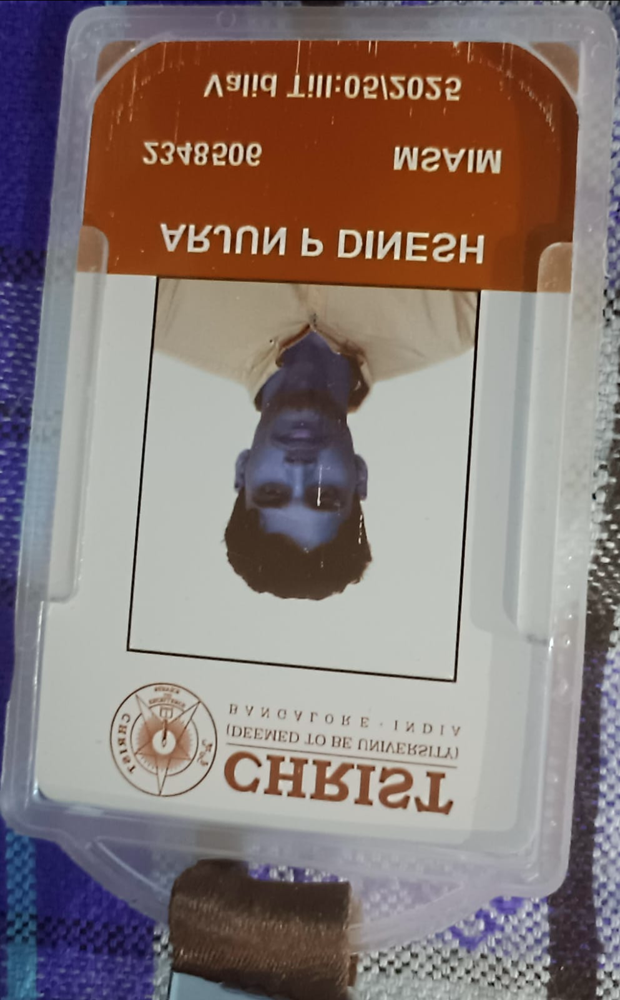

In [17]:
M = np.float32([[1,  0, 0],
                [0, -1, rows],
                [0,  0, 1]])
reflected_img = cv2.warpPerspective(img, M,
                                   (int(cols),
                                    int(rows)))
cv2_imshow( reflected_img)
